In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(rc={'figure.figsize':(11.7,8.27)})
pd.options.display.float_format = '{:20,.2f}'.format
import warnings
warnings.simplefilter("ignore")

from sklearn.feature_extraction.text import TfidfVectorizer
import pyLDAvis
import pyLDAvis.gensim_models
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora
from gensim.models import LdaModel
from gensim import matutils

In [2]:
data = pd.read_csv('./processed_text_almazov.csv')

In [3]:
data.head()

,Регистрационный номер,Номер эпизода,ФИО специалиста,Дата время выполнения,processed_text
0,6612/A19,13654/А2019,Гордеева Мария Сергеевна,2019-03-06 15:00:00.000,режим нагрузка общий рекомендация контроль дав...
1,5382/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 15:30:00.000,режим нагрузка общий рекомендация ограничение ...
2,16663/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 17:30:00.000,режим нагрузка общий рекомендация контроль дав...
3,16322/A19,NaN,Гордеева Мария Сергеевна,2019-03-07 18:00:00.000,режим нагрузка общий рекомендация контроль ад ...
4,18353/A19,NaN,Гордеева Мария Сергеевна,2019-03-12 12:30:00.000,режим нагрузка общий рекомендация контроль дав...


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28124 entries, 0 to 28123
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Регистрационный номер  28124 non-null  object
 1   Номер эпизода          17306 non-null  object
 2   ФИО специалиста        28124 non-null  object
 3   Дата время выполнения  28124 non-null  object
 4   processed_text         28124 non-null  object
dtypes: object(5)
memory usage: 1.1+ MB


## Topic modeling

In [5]:
# Подготовка токенизированного текста
tokenized_texts = data['processed_text'].apply(lambda x: x.split()).tolist()

In [6]:
# 1. Векторизация текста (TF-IDF)
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000)
tfidf_matrix = vectorizer.fit_transform(data['processed_text'])

In [7]:
# 2. Функция для визуализации pyLDAvis
def visualize_topics(lda_model, corpus, dictionary, num_topics):
    """
    Визуализирует темы с помощью pyLDAvis для заданного числа тем.
    """
    print(f'----------Topics number: {num_topics}----------')
    pyLDAvis.enable_notebook()
    panel = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')
    pyLDAvis.display(panel)

In [8]:
# 3. Функция для анализа когерентности и визуализации
def analyze_topics(data, tfidf_matrix, vectorizer, k_range):
    """
    Анализирует когерентность и визуализирует темы для каждого значения k.
    """
    dictionary = corpora.Dictionary(data['processed_text'].apply(lambda x: x.split()))
    corpus = [dictionary.doc2bow(text.split()) for text in data['processed_text']]
    
    # Проверка размеров
    print("Corpus size:", len(corpus))
    print("Dictionary size:", len(dictionary))
    
    coherence_values = []
    
    # Цикл по количеству тем
    for num_topics in k_range:
        print(f"LDA training for {num_topics} topics...")
        # Обучаем модель прямо в цикле
        lda_model = LdaModel(
            corpus=corpus,
            id2word=dictionary,
            num_topics=num_topics,
            random_state=42,
            passes=10,
            iterations=100,
            alpha='auto'
        )
        
        # Рассчитываем когерентность
        coherencemodel = CoherenceModel(
            model=lda_model,
            texts=tokenized_texts,
            dictionary=dictionary,
            coherence='c_v'
        )
        coherence_score = coherencemodel.get_coherence()
        coherence_values.append((num_topics, coherence_score))
        
        # Визуализируем темы
        visualize_topics(lda_model, corpus, dictionary, num_topics)
    
    # Визуализация графика когерентности
    x = [k for k in k_range]
    y = [k[1] for k in coherence_values]
    plt.figure(figsize=(10, 6))
    plt.plot(x, y, marker='o')
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence Score")
    plt.title("Dependence of coherence on the number of topics")
    plt.grid(True)
    plt.show()
    
    # Печать всех значений когерентности
    for num_topics, score in coherence_values:
        print(f"Num Topics: {num_topics}, Coherence Score: {score:.4f}")

Corpus size: 28124
Dictionary size: 3614
LDA training for 2 topics...
----------Topics number: 2----------
LDA training for 3 topics...
----------Topics number: 3----------
LDA training for 4 topics...
----------Topics number: 4----------
LDA training for 5 topics...
----------Topics number: 5----------
LDA training for 6 topics...
----------Topics number: 6----------
LDA training for 7 topics...
----------Topics number: 7----------
LDA training for 8 topics...
----------Topics number: 8----------
LDA training for 9 topics...
----------Topics number: 9----------
LDA training for 10 topics...
----------Topics number: 10----------
LDA training for 11 topics...
----------Topics number: 11----------
LDA training for 12 topics...
----------Topics number: 12----------
LDA training for 13 topics...
----------Topics number: 13----------
LDA training for 14 topics...
----------Topics number: 14----------
LDA training for 15 topics...
----------Topics number: 15----------
LDA training for 16 top

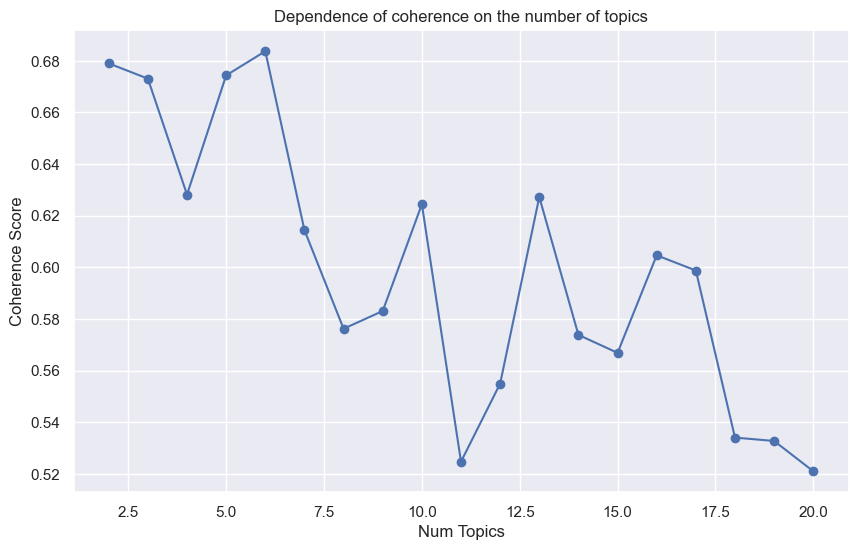

Num Topics: 2, Coherence Score: 0.6790
Num Topics: 3, Coherence Score: 0.6731
Num Topics: 4, Coherence Score: 0.6282
Num Topics: 5, Coherence Score: 0.6744
Num Topics: 6, Coherence Score: 0.6837
Num Topics: 7, Coherence Score: 0.6144
Num Topics: 8, Coherence Score: 0.5762
Num Topics: 9, Coherence Score: 0.5831
Num Topics: 10, Coherence Score: 0.6244
Num Topics: 11, Coherence Score: 0.5247
Num Topics: 12, Coherence Score: 0.5550
Num Topics: 13, Coherence Score: 0.6272
Num Topics: 14, Coherence Score: 0.5738
Num Topics: 15, Coherence Score: 0.5669
Num Topics: 16, Coherence Score: 0.6047
Num Topics: 17, Coherence Score: 0.5988
Num Topics: 18, Coherence Score: 0.5340
Num Topics: 19, Coherence Score: 0.5327
Num Topics: 20, Coherence Score: 0.5210


In [9]:
# 5. Вызов функции анализа
k_range = range(2, 21)
analyze_topics(data, tfidf_matrix, vectorizer, k_range)

## Применение LDA

In [10]:
# Получаем словарь и корпус
dictionary = corpora.Dictionary(data['processed_text'].apply(lambda x: x.split()))
corpus = [dictionary.doc2bow(text.split()) for text in data['processed_text']]

In [13]:
# Обучение LDA модели с фиксированным числом топиков
num_topics = 6
lda_model = LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=num_topics,
    random_state=42,
    passes=10,
    iterations=100,
    alpha='auto'
)

# Визуализация pyLDAvis для финальной модели
pyLDAvis.enable_notebook()
panel = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary, mds='tsne')
pyLDAvis.display(panel)

In [14]:
# Функция для присвоения доминирующей темы
def get_dominant_topic(text, lda_model, dictionary):
    text_bow = dictionary.doc2bow(text.split())
    topic_probabilities = lda_model.get_document_topics(text_bow)
    dominant_topic = max(topic_probabilities, key=lambda item: item[1])[0]
    return dominant_topic

In [15]:
# Присваиваем доминирующую тему
data['dominant_topic'] = data['processed_text'].apply(lambda x: get_dominant_topic(x, lda_model, dictionary))

In [16]:
# Функция для получения топ-слов для каждой темы
def get_topic_top_words(lda_model, num_words=10):
    topic_words = {}
    for topic_id in range(lda_model.num_topics):
        top_words = [word for word, prob in lda_model.show_topic(topic_id, topn=num_words)]
        topic_words[topic_id] = top_words
    return topic_words

In [17]:
# Создаем словарь соответствия между номерами тем и топ-словами
topic_top_words = get_topic_top_words(lda_model)

In [18]:
# Выводим соответствие тем
print("Соответствие тем:")
for topic_id, words in topic_top_words.items():
    print(f"Тема {topic_id} (LDA, начиная с 0): {words}")

Соответствие тем:
Тема 0 (LDA, начиная с 0): ['ад', 'время', 'минута', 'мм', 'ст', 'рт', 'средний', 'один', 'приём', 'дневник']
Тема 1 (LDA, начиная с 0): ['нагрузка', 'физический', 'менее', 'контроль', 'снижение', 'отдых', 'режим', 'труд', 'общий', 'ходьба']
Тема 2 (LDA, начиная с 0): ['ад', 'контроль', 'нагрузка', 'пульс', 'дневник', 'утро', 'вечер', 'режим', 'физ', 'рекомендация']
Тема 3 (LDA, начиная с 0): ['физический', 'неделя', 'нагрузка', 'умеренный', 'менее', 'динамический', 'мина', 'день', 'аэробный', 'упражнение']
Тема 4 (LDA, начиная с 0): ['м', 'контроль', 'кровь', 'кардиолог', 'экг', 'анализ', 'консультация', 'наблюдение', 'год', 'запись']
Тема 5 (LDA, начиная с 0): ['измерение', 'самоконтроль', 'ад', 'домашний', 'дневник', 'давление', 'артериальный', 'условие', 'электронный', 'ведение']


In [19]:
# Распределение тем
print(data['dominant_topic'].value_counts())

dominant_topic
2    15293
1     5620
3     4024
4     1704
5     1125
0      358
Name: count, dtype: int64


## Clustering

In [20]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
import plotly.express as px
import umap

In [21]:
# Функция для поиска оптимального eps для DBSCAN с визуализацией
def find_optimal_eps(matrix, n_neighbors=5, plot=False):
    """
    Находит оптимальное значение eps для DBSCAN с помощью метода "локтя".
    """
    neighbors = NearestNeighbors(n_neighbors=n_neighbors)
    neighbors_fit = neighbors.fit(matrix)
    distances, indices = neighbors_fit.kneighbors(matrix)
    distances = np.sort(distances[:, 1], axis=0)
    
    # Ищем "локоть"
    diffs = np.diff(distances)
    try:
        optimal_index = np.argmax(diffs)
        optimal_eps = distances[optimal_index]
    except ValueError:
        optimal_eps = 0.5  # Запасное значение
    
    # Визуализация графика расстояний (опционально)
    if plot:
        plt.figure(figsize=(8, 4))
        plt.plot(distances)
        plt.axhline(y=optimal_eps, color='r', linestyle='--', label=f'eps={optimal_eps:.2f}')
        plt.xlabel("Sorted points")
        plt.ylabel(f"Distance to {n_neighbors} neighbor")
        plt.title("Elbow method for selecting eps (DBSCAN)")
        plt.legend()
        plt.grid(True)
        plt.show()
    
    return optimal_eps

In [22]:
# Функция для расчета диаметра кластера
def calculate_cluster_diameter(matrix, cluster_labels, cluster_id):
    """
    Вычисляет диаметр кластера (максимальное расстояние между точками) для заданного cluster_id.
    """
    cluster_indices = np.where(cluster_labels == cluster_id)[0]
    if len(cluster_indices) < 2:
        return 0.0  # Если в кластере меньше 2 точек, диаметр = 0
    
    cluster_points = matrix[cluster_indices]
    distances = []
    for i in range(len(cluster_points)):
        for j in range(i + 1, len(cluster_points)):
            dist = np.linalg.norm(cluster_points[i] - cluster_points[j])
            distances.append(dist)
    return max(distances) if distances else 0.0

In [23]:
# Функция для векторизации и кластеризации внутри темы с использованием DBSCAN
def cluster_within_topic(data, topic_id, global_tfidf_matrix=None):
    """
    Векторизует и кластеризует данные внутри определенной темы, используя DBSCAN.
    Возвращает матрицу TF-IDF, метки кластеров и подмножество данных.
    """
    topic_df = data[data['dominant_topic'] == topic_id]
    if len(topic_df) <= 1:
        return None
    
    # Векторизация
    if global_tfidf_matrix is None:
        vectorizer_topic = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000)
        tfidf_matrix_topic = vectorizer_topic.fit_transform(topic_df['processed_text'])
    else:
        indices = topic_df.index
        tfidf_matrix_topic = global_tfidf_matrix[indices]
    
    # Ищем оптимальное значение eps
    optimal_eps = find_optimal_eps(tfidf_matrix_topic.toarray(), plot=True)
    
    # Кластеризация с DBSCAN
    dbscan = DBSCAN(eps=optimal_eps, min_samples=3)
    cluster_labels = dbscan.fit_predict(tfidf_matrix_topic)
    
    # Проверка, были ли созданы кластеры
    if len(np.unique(cluster_labels)) <= 1 and np.unique(cluster_labels)[0] == -1:
        return None
    
    # Оценка качества кластеризации (силуэтный коэффициент, исключая шум)
    non_noise_indices = cluster_labels != -1
    if np.sum(non_noise_indices) > 1 and len(np.unique(cluster_labels[non_noise_indices])) > 1:
        silhouette = silhouette_score(tfidf_matrix_topic[non_noise_indices], cluster_labels[non_noise_indices])
        print(f"Silhouette score for topic {topic_id}: {silhouette:.4f}")
    
    return tfidf_matrix_topic, cluster_labels, topic_df

In [24]:
# Функция для визуализации кластеризации
def visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="tsne"):
    """
    Снижает размерность (t-SNE или UMAP) и визуализирует кластеры с диаметрами.
    """
    # Выбираем метод снижения размерности
    if method.lower() == "tsne":
        tsne = TSNE(n_components=3, random_state=42, perplexity=min(5, len(topic_df) - 1))
        reduced_matrix = tsne.fit_transform(tfidf_matrix_topic.toarray())
        dim1, dim2, dim3 = "TSNE Dimension 1", "TSNE Dimension 2", "TSNE Dimension 3"
    else:  # UMAP
        reducer = umap.UMAP(n_components=3, random_state=42, n_neighbors=5, min_dist=0.1, n_jobs=-1)
        reduced_matrix = reducer.fit_transform(tfidf_matrix_topic.toarray())
        dim1, dim2, dim3 = "UMAP Dimension 1", "UMAP Dimension 2", "UMAP Dimension 3"
    
    # Создаем DataFrame для визуализации
    vis_df = pd.DataFrame({
        dim1: reduced_matrix[:, 0],
        dim2: reduced_matrix[:, 1],
        dim3: reduced_matrix[:, 2],
        'Cluster': cluster_labels
    }, index=topic_df.index)
    
    # Вычисляем диаметры для каждого кластера
    unique_clusters = np.unique(cluster_labels)
    cluster_diameters = {}
    for cluster_id in unique_clusters:
        if cluster_id != -1:  # Исключаем шум
            diameter = calculate_cluster_diameter(reduced_matrix, cluster_labels, cluster_id)
            cluster_diameters[cluster_id] = diameter
            print(f"Topic {topic_id}, Cluster {cluster_id}: Diameter = {diameter:.4f}")
    
    # Добавляем диаметры в визуализацию (в виде текста)
    annotations = []
    for cluster_id, diameter in cluster_diameters.items():
        cluster_center = vis_df[vis_df['Cluster'] == cluster_id].mean()
        annotations.append(
            dict(
                x=cluster_center[dim1],
                y=cluster_center[dim2],
                z=cluster_center[dim3],
                text=f"Cluster {cluster_id}<br>Diameter: {diameter:.4f}",
                showarrow=True,
                arrowhead=2
            )
        )
    
    # Визуализация с помощью Plotly Express
    fig = px.scatter_3d(
        vis_df,
        x=dim1,
        y=dim2,
        z=dim3,
        color='Cluster',
        title=f'Clustering (DBSCAN) for topic {topic_id} ({method.upper()})',
        color_discrete_sequence=px.colors.qualitative.Dark24
    )
    fig.update_layout(scene=dict(annotations=annotations))
#     fig.write_html(f"cluster_topic_{topic_id}_{method.lower()}.html")
    fig.show()

In [25]:
# Применяем кластеризацию для каждой темы, сохраняем метки и визуализируем
# Создаем столбцы для всех тем заранее
for topic_id in range(num_topics):
    data[f'cluster_topic_{topic_id}'] = np.nan

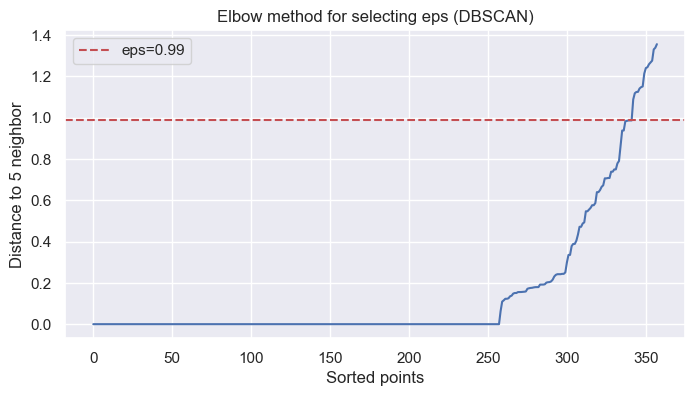

Silhouette score for topic 0: 0.4166
Topic 0, Cluster 0: Diameter = 13.1471
Topic 0, Cluster 1: Diameter = 40.8246
Topic 0, Cluster 2: Diameter = 16.3181
Topic 0, Cluster 3: Diameter = 294.6933
Topic 0, Cluster 4: Diameter = 142.7437
Topic 0, Cluster 5: Diameter = 22.7953
Topic 0, Cluster 6: Diameter = 27.7981
Topic 0, Cluster 7: Diameter = 8.1138
Topic 0, Cluster 8: Diameter = 16.0992


Topic 0, Cluster 0: Diameter = 0.0861
Topic 0, Cluster 1: Diameter = 0.8312
Topic 0, Cluster 2: Diameter = 0.3139
Topic 0, Cluster 3: Diameter = 29.2852
Topic 0, Cluster 4: Diameter = 38.4827
Topic 0, Cluster 5: Diameter = 0.2416
Topic 0, Cluster 6: Diameter = 0.5288
Topic 0, Cluster 7: Diameter = 0.1194
Topic 0, Cluster 8: Diameter = 0.1647


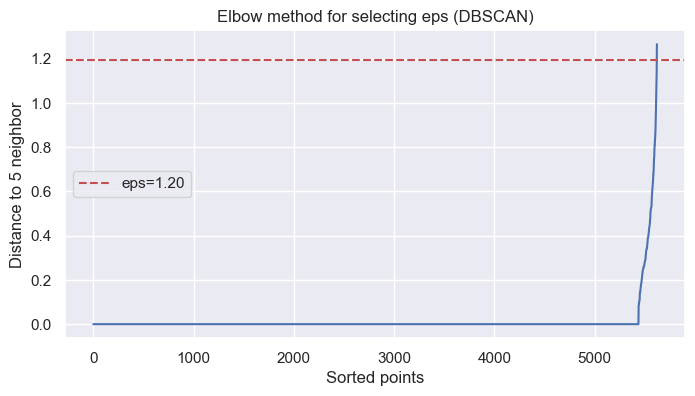

Topic 1, Cluster 0: Diameter = 875.1877


Topic 1, Cluster 0: Diameter = 39.0497


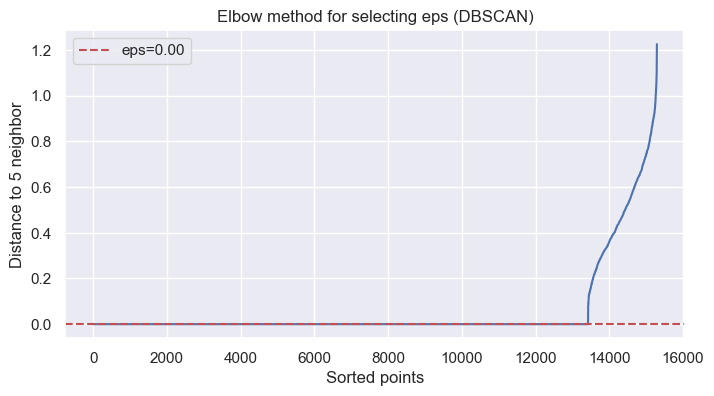

Silhouette score for topic 2: 1.0000
Topic 2, Cluster 0: Diameter = 0.0000
Topic 2, Cluster 1: Diameter = 3.0438
Topic 2, Cluster 2: Diameter = 0.0008
Topic 2, Cluster 3: Diameter = 2.0080
Topic 2, Cluster 4: Diameter = 0.5355
Topic 2, Cluster 5: Diameter = 0.0007
Topic 2, Cluster 6: Diameter = 2.4393
Topic 2, Cluster 7: Diameter = 222.0946
Topic 2, Cluster 8: Diameter = 0.0000
Topic 2, Cluster 9: Diameter = 4.1427
Topic 2, Cluster 10: Diameter = 2.8103
Topic 2, Cluster 11: Diameter = 44.8899
Topic 2, Cluster 12: Diameter = 0.0000
Topic 2, Cluster 13: Diameter = 2.0302
Topic 2, Cluster 14: Diameter = 3.4301
Topic 2, Cluster 15: Diameter = 0.0000
Topic 2, Cluster 16: Diameter = 0.0000
Topic 2, Cluster 17: Diameter = 2.5870
Topic 2, Cluster 18: Diameter = 0.0017
Topic 2, Cluster 19: Diameter = 0.0000
Topic 2, Cluster 20: Diameter = 0.0002
Topic 2, Cluster 21: Diameter = 0.0000
Topic 2, Cluster 22: Diameter = 2.0844
Topic 2, Cluster 23: Diameter = 1.8871
Topic 2, Cluster 24: Diameter = 0.

Topic 2, Cluster 265: Diameter = 3.1735
Topic 2, Cluster 266: Diameter = 3.0159
Topic 2, Cluster 267: Diameter = 140.4046
Topic 2, Cluster 268: Diameter = 4.1759
Topic 2, Cluster 269: Diameter = 5.0814
Topic 2, Cluster 270: Diameter = 2.0121
Topic 2, Cluster 271: Diameter = 3.2831
Topic 2, Cluster 272: Diameter = 0.0011
Topic 2, Cluster 273: Diameter = 0.0002
Topic 2, Cluster 274: Diameter = 3.8995
Topic 2, Cluster 275: Diameter = 0.0000
Topic 2, Cluster 276: Diameter = 1.9935
Topic 2, Cluster 277: Diameter = 0.0000
Topic 2, Cluster 278: Diameter = 1.9891
Topic 2, Cluster 279: Diameter = 0.0011
Topic 2, Cluster 280: Diameter = 0.0000
Topic 2, Cluster 281: Diameter = 0.0000
Topic 2, Cluster 282: Diameter = 3.3213
Topic 2, Cluster 283: Diameter = 0.0000
Topic 2, Cluster 284: Diameter = 2.1146
Topic 2, Cluster 285: Diameter = 0.0024
Topic 2, Cluster 286: Diameter = 2.6918
Topic 2, Cluster 287: Diameter = 0.0000
Topic 2, Cluster 288: Diameter = 3.9957
Topic 2, Cluster 289: Diameter = 2.443

Topic 2, Cluster 0: Diameter = 0.0004
Topic 2, Cluster 1: Diameter = 0.9753
Topic 2, Cluster 2: Diameter = 0.0679
Topic 2, Cluster 3: Diameter = 0.1048
Topic 2, Cluster 4: Diameter = 0.0566
Topic 2, Cluster 5: Diameter = 0.0003
Topic 2, Cluster 6: Diameter = 0.4217
Topic 2, Cluster 7: Diameter = 19.0150
Topic 2, Cluster 8: Diameter = 0.0004
Topic 2, Cluster 9: Diameter = 11.7352
Topic 2, Cluster 10: Diameter = 8.0019
Topic 2, Cluster 11: Diameter = 21.2995
Topic 2, Cluster 12: Diameter = 0.0030
Topic 2, Cluster 13: Diameter = 0.0697
Topic 2, Cluster 14: Diameter = 1.0783
Topic 2, Cluster 15: Diameter = 0.1041
Topic 2, Cluster 16: Diameter = 0.0127
Topic 2, Cluster 17: Diameter = 3.8556
Topic 2, Cluster 18: Diameter = 0.0014
Topic 2, Cluster 19: Diameter = 0.0082
Topic 2, Cluster 20: Diameter = 0.0006
Topic 2, Cluster 21: Diameter = 0.0714
Topic 2, Cluster 22: Diameter = 0.1027
Topic 2, Cluster 23: Diameter = 0.0702
Topic 2, Cluster 24: Diameter = 0.0004
Topic 2, Cluster 25: Diameter = 

Topic 2, Cluster 265: Diameter = 7.7670
Topic 2, Cluster 266: Diameter = 0.1810
Topic 2, Cluster 267: Diameter = 11.6287
Topic 2, Cluster 268: Diameter = 12.3236
Topic 2, Cluster 269: Diameter = 9.7361
Topic 2, Cluster 270: Diameter = 0.0892
Topic 2, Cluster 271: Diameter = 6.8427
Topic 2, Cluster 272: Diameter = 0.0617
Topic 2, Cluster 273: Diameter = 0.0003
Topic 2, Cluster 274: Diameter = 20.9891
Topic 2, Cluster 275: Diameter = 0.0007
Topic 2, Cluster 276: Diameter = 0.1492
Topic 2, Cluster 277: Diameter = 0.0002
Topic 2, Cluster 278: Diameter = 0.2160
Topic 2, Cluster 279: Diameter = 0.0032
Topic 2, Cluster 280: Diameter = 0.0197
Topic 2, Cluster 281: Diameter = 0.0013
Topic 2, Cluster 282: Diameter = 1.1106
Topic 2, Cluster 283: Diameter = 0.0037
Topic 2, Cluster 284: Diameter = 0.1405
Topic 2, Cluster 285: Diameter = 0.0123
Topic 2, Cluster 286: Diameter = 6.0966
Topic 2, Cluster 287: Diameter = 0.1219
Topic 2, Cluster 288: Diameter = 11.1644
Topic 2, Cluster 289: Diameter = 9.4

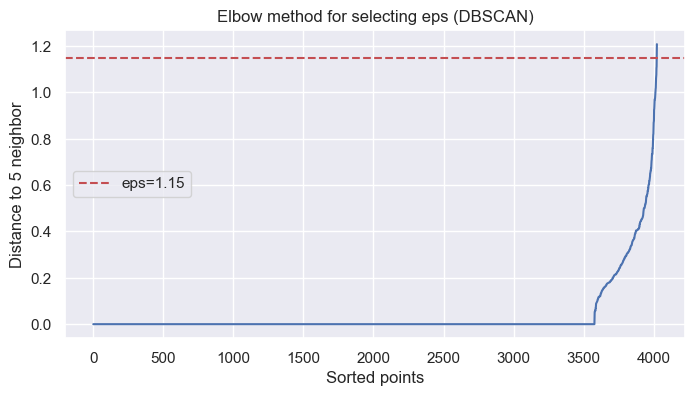

Silhouette score for topic 3: 0.1718
Topic 3, Cluster 0: Diameter = 222.3376
Topic 3, Cluster 1: Diameter = 0.0000


Topic 3, Cluster 0: Diameter = 36.3091
Topic 3, Cluster 1: Diameter = 0.0200


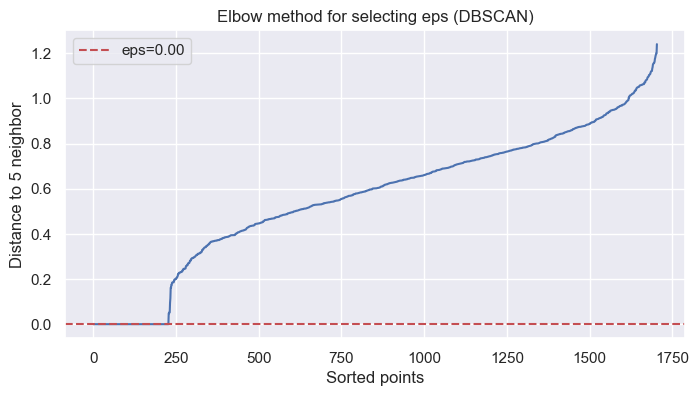

Silhouette score for topic 4: 1.0000
Topic 4, Cluster 0: Diameter = 0.0000
Topic 4, Cluster 1: Diameter = 4.1943
Topic 4, Cluster 2: Diameter = 0.0011
Topic 4, Cluster 3: Diameter = 6.6666
Topic 4, Cluster 4: Diameter = 4.6659
Topic 4, Cluster 5: Diameter = 1.4059
Topic 4, Cluster 6: Diameter = 2.1980
Topic 4, Cluster 7: Diameter = 0.0000
Topic 4, Cluster 8: Diameter = 0.0000
Topic 4, Cluster 9: Diameter = 0.0000
Topic 4, Cluster 10: Diameter = 0.5832
Topic 4, Cluster 11: Diameter = 0.2622
Topic 4, Cluster 12: Diameter = 0.0006
Topic 4, Cluster 13: Diameter = 0.4367
Topic 4, Cluster 14: Diameter = 0.0002
Topic 4, Cluster 15: Diameter = 0.0000
Topic 4, Cluster 16: Diameter = 0.0000
Topic 4, Cluster 17: Diameter = 0.0000


Topic 4, Cluster 0: Diameter = 0.0632
Topic 4, Cluster 1: Diameter = 0.2555
Topic 4, Cluster 2: Diameter = 0.0877
Topic 4, Cluster 3: Diameter = 0.4816
Topic 4, Cluster 4: Diameter = 0.1874
Topic 4, Cluster 5: Diameter = 0.0962
Topic 4, Cluster 6: Diameter = 0.2214
Topic 4, Cluster 7: Diameter = 0.2452
Topic 4, Cluster 8: Diameter = 0.0441
Topic 4, Cluster 9: Diameter = 0.0282
Topic 4, Cluster 10: Diameter = 0.0840
Topic 4, Cluster 11: Diameter = 0.0431
Topic 4, Cluster 12: Diameter = 0.0421
Topic 4, Cluster 13: Diameter = 0.0295
Topic 4, Cluster 14: Diameter = 0.1219
Topic 4, Cluster 15: Diameter = 0.0389
Topic 4, Cluster 16: Diameter = 0.0192
Topic 4, Cluster 17: Diameter = 0.0981


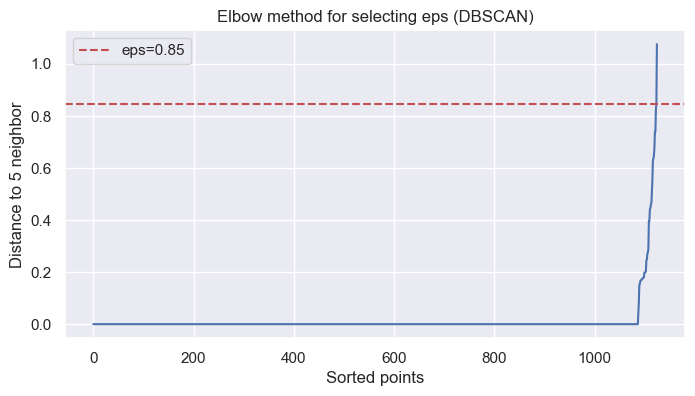

Silhouette score for topic 5: 0.4172
Topic 5, Cluster 0: Diameter = 123.2302
Topic 5, Cluster 1: Diameter = 50.7279
Topic 5, Cluster 2: Diameter = 12.2150
Topic 5, Cluster 3: Diameter = 0.0000
Topic 5, Cluster 4: Diameter = 24.5290


Topic 5, Cluster 0: Diameter = 35.3761
Topic 5, Cluster 1: Diameter = 8.3386
Topic 5, Cluster 2: Diameter = 0.3145
Topic 5, Cluster 3: Diameter = 0.0001
Topic 5, Cluster 4: Diameter = 0.3639


In [26]:
# Кластеризация и визуализация
for topic_id in range(num_topics):
    result = cluster_within_topic(data, topic_id, global_tfidf_matrix=tfidf_matrix)
    if result:
        tfidf_matrix_topic, cluster_labels, topic_df = result
        data.loc[topic_df.index, f'cluster_topic_{topic_id}'] = cluster_labels
        
        # Визуализация с t-SNE
        visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="tsne")
        # Визуализация с UMAP
        visualize_clusters(tfidf_matrix_topic, cluster_labels, topic_df, topic_id, method="umap")
    else:
        print(f"It is impossible to cluster for topic {topic_id}. Check the number of records.")

In [27]:
data['cluster_topic_5'].unique()

array([nan,  0., -1.,  1.,  2.,  3.,  4.])

In [28]:
data[data['cluster_topic_5']==4]['processed_text'].unique()

array(['измерение ад утро вечер ведение дневник самоконтроль ежегодный профилактический обследование',
       'измерение ад утро вечер ведение дневник самоконтроль ежедневный физический активность минута день умеренный темп ежегодный профилактический обследование'],
      dtype=object)

In [29]:
data[data['cluster_topic_3']==1]['processed_text'].unique()

array(['любой основный физический активность'], dtype=object)

In [30]:
data[data['cluster_topic_3']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник отказ курение ограничение потребление поваренный соль г сутки увеличение физический активность избегать малоподвижный образ жизнь умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя',
       'режим нагрузка общий рекомендация увеличение физический активность избегать малоподвижный образ жизнь умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя',
       'режим нагрузка общий рекомендация умеренный аэробный физический активность менее мина неделя мина день день неделя интенсивный физический нагрузка менее мина неделя мина день день неделя контроль ад раз день ведение дневник ад',
       'режим нагрузка общий рекомендация контроль давление пульс раз день ведение дневник умеренный аэробный физический а

In [31]:
data[data['cluster_topic_3']==1]['processed_text'].unique()

array(['любой основный физический активность'], dtype=object)

In [32]:
data[data['cluster_topic_5']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация измерение артериальный давление домашний условие помощь электронный автоматический тонометр самоконтроль артериальный давление ведение бумажный электронный дневник самоконтроль подробный рекомендация правило измерение давление письменный вид выдать пациент целевой показатель ад домашний условие наличие менее измерение последний неделя идеал измерение менее мм рт ст регулярный калибровка домашний тонометр реже месяц',
       'режим нагрузка общий рекомендация измерение ада чсс домашний условие ведение бумажный электронный дневник самоконтроль целевой показатель ад домашний условие мм рт ст',
       'режим нагрузка общий рекомендация ежедневный контроль артериальный давление пульс ведение дневник самоконтроль целевой значение ад мм рт ст',
       'режим нагрузка общий рекомендация змерение артериальный давление домашний условие помощь электронный автоматический тонометр самоконтроль артериальный давление ведение бумажный электронный дневник самок

In [33]:
data[data['cluster_topic_5']==1]['processed_text'].unique()

array(['ведение дневник пульс ад х раз день течение месяц',
       'ведение дневник пульс ад х раз день течение месяц коррекция вес'],
      dtype=object)

In [34]:
data[data['cluster_topic_5']==2]['processed_text'].unique()

array(['ведение дневник ад', 'самоконтроль ад чсс ведение дневник'],
      dtype=object)

In [35]:
data[data['cluster_topic_5']==3]['processed_text'].unique()

array(['измерение ад утро вечер ведение дневник самоконтроль'],
      dtype=object)

In [36]:
data[data['cluster_topic_5']==4]['processed_text'].unique()

array(['измерение ад утро вечер ведение дневник самоконтроль ежегодный профилактический обследование',
       'измерение ад утро вечер ведение дневник самоконтроль ежедневный физический активность минута день умеренный темп ежегодный профилактический обследование'],
      dtype=object)

In [37]:
data[data['cluster_topic_5'].notna()]['cluster_topic_5'].value_counts()

cluster_topic_5
 0.00    948
 1.00    130
 4.00     24
 2.00     16
 3.00      5
-1.00      2
Name: count, dtype: int64

In [38]:
data[data['cluster_topic_4']==0]['processed_text'].unique()

array(['режим нагрузка общий рекомендация контроль ад пульс запись дневник двигательный активность самочувствие ежедневный прогулка свежий воздух целевой значение липидный спектр общ холестерин ммоль л триглицериды ммоль л холестерин лпвп ммоль л женщина ммоль л холестерин лпнп ммоль л'],
      dtype=object)

In [39]:
data[data['cluster_topic_4']==1]['processed_text'].unique()

array(['х раз день'], dtype=object)

In [40]:
data[data['cluster_topic_4']==2]['processed_text'].unique()

array(['режим нагрузка общий рекомендация дообследование стресс эхо м',
       'режим нагрузка общий рекомендация дообследование м стресс эхо'],
      dtype=object)

In [41]:
data[data['cluster_topic_4']==3]['processed_text'].unique()

array(['наблюдение кардиолог место жительство контроль пульс ад запись дневник самоконтроль',
       'наблюдение кардиолог инфекционист место жительство контроль пульс ад запись дневник самоконтроль'],
      dtype=object)

In [42]:
data.groupby('Регистрационный номер')['Регистрационный номер'].count().sort_values(ascending=False).head(20)

Регистрационный номер
53297/A16     2
82427/A22     2
37555/A22     2
9899/A12      2
85176/A22     2
111655/A21    2
10699/A22     2
52665/A21     2
105811/A24    2
112903/A22    2
54665/A22     2
67405/A24     2
67413/A22     2
86448/A22     2
111609/A21    2
58302/A24     2
108366/A22    2
140642/A23    2
11417/A23     2
85126/A22     2
Name: Регистрационный номер, dtype: int64

In [43]:
data[data['Регистрационный номер']=='7332/A15']['processed_text'].values

array(['контроль ад достаточно измерять раз день утро вечер ведение дневник',
       'дозированные динамический физический нагрузка'], dtype=object)

In [44]:
data[data['Регистрационный номер']=='57279/A14']['processed_text'].values

array(['нормализация режим труд отдых избегать переутомление эмоциональный нагрузка дозированные физический нагрузка ходьба утренний гимнастика регулярный аэробный упражнение физический активность менее мина ежедневно контроль общий самочувствие эффективный фн должный приводить увеличение пульс менее измерение артериальный давление домашний условие ведение бумажный электронный дневник самоконтроль целевой показатель ад домашний условие менее мм рт ст резкий мм рт ст симптомном повышение ад любой уровень мм рт ст дополнительно приём либо таблетка каптоприл капотен аналог мг растворить язык либо таблетка моксонидин физиотенз аналог мг запить стакан',
       'тёплый негазированный вода'], dtype=object)

In [45]:
data[data['Регистрационный номер']=='44192/A24']['processed_text'].values

array(['курить контроль ад день',
       'дозированные динамический физический нагрузка'], dtype=object)

In [46]:
data[data['Регистрационный номер']=='9899/A12']['processed_text'].values

array(['режим нагрузка общий рекомендация',
       'дозированная динамический физический нагрузка вызывать утомление'],
      dtype=object)

In [47]:
data[data['Регистрационный номер']=='15315/A23']['processed_text'].values

array(['прекратить курение контроль ад утро приём лекарство',
       'дозированные динамический физический нагрузка'], dtype=object)

## Связь слов

In [48]:
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx
from pyvis.network import Network
from community import community_louvain

In [49]:
# 1. TF-IDF + извлечение ключевых слов
vectorizer = TfidfVectorizer(
    max_features=100,      # лимит слов
    min_df=2,              # слово должно быть хотя бы в 2 документах
    max_df=0.95,
    ngram_range=(1, 2),    # включаем биграммы!
    token_pattern=r'(?u)\b\w+\b'  # для русских слов
)
tfidf_matrix = vectorizer.fit_transform(data['processed_text'])
feature_names = vectorizer.get_feature_names_out()

In [50]:
# 2. Вычисляем близость слов (по косинусу в контексте)
# Транспонируем: строки = слова, столбцы = документы
word_doc_matrix = tfidf_matrix.T

# Косинусная схожесть между словами
word_similarity = cosine_similarity(word_doc_matrix)

In [51]:
# 3. Строим граф
G = nx.Graph()

# Порог схожести для ребра
THRESHOLD = 0.3

# Добавляем узлы и ребра
for i, w1 in enumerate(feature_names):
    for j, w2 in enumerate(feature_names):
        if i >= j: continue
        sim = word_similarity[i, j]
        if sim > THRESHOLD:
            G.add_edge(w1, w2, weight=sim)

In [52]:
# 4. МЕТРИКИ ЦЕНТРАЛЬНОСТИ
deg_centrality = nx.degree_centrality(G)
bet_centrality = nx.betweenness_centrality(G)
close_centrality = nx.closeness_centrality(G)
pagerank = nx.pagerank(G)

In [53]:
# 5. СООБЩЕСТВА (мотивы) — Louvain
partition = community_louvain.best_partition(G, weight='weight')

In [54]:
highlight_words = ['ад', 'время', 'минута', 'мм', 'ст', 'рт', 'средний', 'один', 'приём', 'дневник']
highlight_words = highlight_words + ['нагрузка', 'физический', 'менее', 'контроль', 'снижение', 'отдых', 'режим', 'труд', 'общий', 'ходьба']
highlight_words = highlight_words + ['ад', 'контроль', 'нагрузка', 'пульс', 'дневник', 'утро', 'вечер', 'режим', 'физ', 'рекомендация']
highlight_words = highlight_words + ['физический', 'неделя', 'нагрузка', 'умеренный', 'менее', 'динамический', 'мина', 'день', 'аэробный', 'упражнение']
highlight_words = highlight_words + ['м', 'контроль', 'кровь', 'кардиолог', 'экг', 'анализ', 'консультация', 'наблюдение', 'год', 'запись']
highlight_words = highlight_words + ['измерение', 'самоконтроль', 'ад', 'домашний', 'дневник', 'давление', 'артериальный', 'условие', 'электронный', 'ведение']
highlight_words = list(set(highlight_words))

In [55]:
# 6. Размер узлов по степени
max_deg = max(deg_centrality.values()) if deg_centrality else 1
for node in G.nodes():
    deg = deg_centrality[node]
    G.nodes[node]['size'] = 15 + 40 * (deg / max_deg)
    G.nodes[node]['degree'] = deg
    G.nodes[node]['betweenness'] = bet_centrality[node]
    G.nodes[node]['closeness'] = close_centrality[node]
    G.nodes[node]['pagerank'] = pagerank[node]
    G.nodes[node]['community'] = partition[node]
    # Выделяем красным слова из темы "контроль АД"
    if node in highlight_words:
        G.nodes[node]['color'] = 'red'
        G.nodes[node]['size'] = max(G.nodes[node]['size'], 35)
    else:
        G.nodes[node]['color'] = 'lightblue'

In [56]:
# 7. ЭКСПОРТ ДАННЫХ

# --- Узлы (nodes.csv) ---
nodes_df = pd.DataFrame([
    {
        'id': node,
        'label': node,
        'degree': deg_centrality[node],
        'betweenness': bet_centrality[node],
        'closeness': close_centrality[node],
        'pagerank': pagerank[node],
        'community': partition[node],
        'size': G.nodes[node]['size'],
        'color': G.nodes[node]['color']
    }
    for node in G.nodes()
])
nodes_df = nodes_df.sort_values('degree', ascending=False)
nodes_df.to_csv('nodes.csv', index=False, encoding='utf-8-sig')
print("nodes.csv — сохранено")

# --- Ребра (edges.csv) ---
edges_df = pd.DataFrame([
    {'source': u, 'target': v, 'weight': d['weight']}
    for u, v, d in G.edges(data=True)
])
edges_df.to_csv('edges.csv', index=False, encoding='utf-8-sig')
print("edges.csv — сохранено")

# --- Gephi: .gexf ---
nx.write_gexf(G, "graph_for_gephi.gexf")
print("graph_for_gephi.gexf — для Gephi")

# --- Универсальный: .graphml ---
nx.write_graphml(G, "graph.graphml")
print("graph.graphml — универсальный формат")

nodes.csv — сохранено
edges.csv — сохранено
graph_for_gephi.gexf — для Gephi
graph.graphml — универсальный формат


In [57]:
# 9. ТОП-10 по центральности
# -------------------------------
print("\nТОП-10 УЗЛОВ ПО ЦЕНТРАЛЬНОСТИ:")
top = nodes_df.head(10)[['label', 'degree', 'betweenness', 'pagerank', 'community']]
print(top.to_string(index=False))


ТОП-10 УЗЛОВ ПО ЦЕНТРАЛЬНОСТИ:
                  label               degree          betweenness             pagerank  community
                  менее                 0.62                 0.08                 0.02          3
               нагрузка                 0.58                 0.12                 0.01          0
             физический                 0.57                 0.03                 0.01          0
               аэробный                 0.55                 0.04                 0.01          2
дозированные физический                 0.54                 0.00                 0.01          2
               снижение                 0.54                 0.03                 0.01          3
             регулярный                 0.54                 0.05                 0.01          2
    аэробный упражнение                 0.53                 0.00                 0.01          2
             труд отдых                 0.53                 0.00                 0.01

In [58]:
# 10. СООБЩЕСТВА (мотивы)
# -------------------------------
comm_sizes = pd.Series(partition.values()).value_counts().sort_values(ascending=False)
print(f"\nНайдено {len(comm_sizes)} сообществ:")
for comm, size in comm_sizes.items():
    words = [n for n, c in partition.items() if c == comm]
    print(f"  Сообщество {comm} ({size} слов): {', '.join(words[:8])}{'...' if len(words)>8 else ''}")


Найдено 4 сообществ:
  Сообщество 2 (42 слов): активность, активность менее, аэробный, аэробный упражнение, гимнастика, гимнастика регулярный, дозированные физический, ежедневно...
  Сообщество 0 (28 слов): ад, ад пульс, ад чсс, вечер, дневник, контроль, контроль ад, нагрузка...
  Сообщество 3 (18 слов): день, пульс раз, должный, менее, снижение, увеличение, эффективный, день дневник...
  Сообщество 1 (11 слов): ведение, ведение дневник, артериальный, артериальный давление, давление, домашний, измерение, самоконтроль...


In [59]:
# # 4. Увеличиваем размер узлов по степени (важности)
# degrees = dict(G.degree())
# max_degree = max(degrees.values()) if degrees else 1
# for node in G.nodes():
#     deg = degrees.get(node, 0)
#     # Размер: от 10 до 50
#     size = 10 + 40 * (deg / max_degree)
#     G.nodes[node]['size'] = size

In [60]:
# # 5. Увеличиваем размер узлов по степени (важности)
# # highlight_words = ['ад', 'давление', 'контроль', 'измерение']  # ← ваша тема
# for node in G.nodes():
#     if node in highlight_words:
#         G.nodes[node]['color'] = 'red'
#         G.nodes[node]['size'] = max(G.nodes[node]['size'], 30)
#     else:
#         G.nodes[node]['color'] = '#97c2fc'  # светло-синий

In [61]:
# # 6. Выделяем красным слова из определённой темы (например, "ад")
# net = Network(height="750px", width="100%", bgcolor="#ffffff", font_color="black")
# net.from_nx(G)

# # Настройки физики
# net.set_options("""
# var options = {
#   "nodes": {
#     "font": {"size": 20},
#     "borderWidth": 2
#   },
#   "edges": {
#     "color": {"inherit": true},
#     "smooth": false
#   },
#   "physics": {
#     "enabled": true,
#     "barnesHut": {
#       "gravitationalConstant": -8000,
#       "springLength": 150,
#       "springStrength": 0.05
#     }
#   }
# }
# """)

In [62]:
# # Сохраняем
# net.save_graph("keyword_network.html")
# print("Граф сохранён: keyword_network.html")

In [4]:
# data.to_csv('data.csv', index=False)

In [5]:
# data = pd.read_csv('data.csv')

In [41]:
data.loc[(data['dominant_topic']==5) & (data['cluster_topic_5']==3)]['processed_text'].values

array(['измерение ад утро вечер ведение дневник самоконтроль',
       'измерение ад утро вечер ведение дневник самоконтроль',
       'измерение ад утро вечер ведение дневник самоконтроль',
       'измерение ад утро вечер ведение дневник самоконтроль',
       'измерение ад утро вечер ведение дневник самоконтроль'],
      dtype=object)

In [35]:
data[data['ФИО специалиста']=='Ионов Михаил Васильевич']

,Регистрационный номер,Номер эпизода,ФИО специалиста,Дата время выполнения,processed_text,dominant_topic,cluster_topic_0,cluster_topic_1,cluster_topic_2,cluster_topic_3,cluster_topic_4,cluster_topic_5
83,21629/A19,NaN,Ионов Михаил Васильевич,2019-04-02 13:30:00.000,режим нагрузка общий рекомендация измерение ар...,5,NaN,NaN,NaN,NaN,NaN,0.00
114,43518/A12,NaN,Ионов Михаил Васильевич,2019-04-05 12:00:00.000,режим нагрузка общий рекомендация измерение ар...,5,NaN,NaN,NaN,NaN,NaN,0.00
145,26594/A19,NaN,Ионов Михаил Васильевич,2019-04-09 13:30:00.000,режим нагрузка общий рекомендация измерение ар...,5,NaN,NaN,NaN,NaN,NaN,0.00
147,23556/A19,NaN,Ионов Михаил Васильевич,2019-04-09 14:15:00.000,режим нагрузка общий рекомендация измерение ар...,5,NaN,NaN,NaN,NaN,NaN,0.00
183,25093/A19,NaN,Ионов Михаил Васильевич,2019-04-12 14:15:00.000,режим нагрузка общий рекомендация измерение ар...,5,NaN,NaN,NaN,NaN,NaN,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
27936,15325/A08,157324/А2024,Ионов Михаил Васильевич,2024-12-19 15:45:00.000,измерение артериальный давление домашний услов...,5,NaN,NaN,NaN,NaN,NaN,0.00
27982,1364/A19,158012/А2024,Ионов Михаил Васильевич,2024-12-21 09:45:00.000,измерение артериальный давление домашний услов...,5,NaN,NaN,NaN,NaN,NaN,0.00
27992,138363/A24,NaN,Ионов Михаил Васильевич,2024-12-21 13:30:00.000,измерение артериальный давление домашний услов...,5,NaN,NaN,NaN,NaN,NaN,0.00
27994,138737/A24,158170/А2024,Ионов Михаил Васильевич,2024-12-21 14:15:00.000,измерение артериальный давление домашний услов...,5,NaN,NaN,NaN,NaN,NaN,0.00


In [14]:
data[data['ФИО специалиста']=='Гордеева Мария Сергеевна']['processed_text'][4]

,Регистрационный номер,Номер эпизода,ФИО специалиста,Дата время выполнения,processed_text,dominant_topic,cluster_topic_0,cluster_topic_1,cluster_topic_2,cluster_topic_3,cluster_topic_4,cluster_topic_5
0,6612/A19,13654/А2019,Гордеева Мария Сергеевна,2019-03-06 15:00:00.000,режим нагрузка общий рекомендация контроль дав...,2,NaN,NaN,0.00,NaN,NaN,NaN
1,5382/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 15:30:00.000,режим нагрузка общий рекомендация ограничение ...,0,0.00,NaN,NaN,NaN,NaN,NaN
2,16663/A19,NaN,Гордеева Мария Сергеевна,2019-03-06 17:30:00.000,режим нагрузка общий рекомендация контроль дав...,2,NaN,NaN,0.00,NaN,NaN,NaN
3,16322/A19,NaN,Гордеева Мария Сергеевна,2019-03-07 18:00:00.000,режим нагрузка общий рекомендация контроль ад ...,2,NaN,NaN,-1.00,NaN,NaN,NaN
4,18353/A19,NaN,Гордеева Мария Сергеевна,2019-03-12 12:30:00.000,режим нагрузка общий рекомендация контроль дав...,3,NaN,NaN,NaN,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
27645,74264/A22,150562/А2024,Гордеева Мария Сергеевна,2024-12-06 10:30:00.000,контроль ад чсс раз день ведение дневник умере...,2,NaN,NaN,334.00,NaN,NaN,NaN
27646,42148/A18,NaN,Гордеева Мария Сергеевна,2024-12-06 11:00:00.000,избегать малоподвижный образ жизнь сократить в...,3,NaN,NaN,NaN,0.00,NaN,NaN
27647,52615/A23,138492/А2024,Гордеева Мария Сергеевна,2024-12-06 11:30:00.000,контроль ад чсс раз день ведение дневник огран...,2,NaN,NaN,389.00,NaN,NaN,NaN
27747,52613/A24,153067/А2024,Гордеева Мария Сергеевна,2024-12-11 11:30:00.000,контроль ад чсс раз день ведение дневник огран...,2,NaN,NaN,341.00,NaN,NaN,NaN


In [65]:
data['Регистрационный номер'].nunique()

27952

In [66]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28124 entries, 0 to 28123
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Регистрационный номер  28124 non-null  object 
 1   Номер эпизода          17306 non-null  object 
 2   ФИО специалиста        28124 non-null  object 
 3   Дата время выполнения  28124 non-null  object 
 4   processed_text         28124 non-null  object 
 5   dominant_topic         28124 non-null  int64  
 6   cluster_topic_0        358 non-null    float64
 7   cluster_topic_1        5620 non-null   float64
 8   cluster_topic_2        15293 non-null  float64
 9   cluster_topic_3        4024 non-null   float64
 10  cluster_topic_4        1704 non-null   float64
 11  cluster_topic_5        1125 non-null   float64
dtypes: float64(6), int64(1), object(5)
memory usage: 2.6+ MB
